# Entrega 2: Preparación de los datos

## Sección imágenes

<b>Proyecto: Identificación de melanomas en imágenes de lesiones de piel</b>

Grupo 1 - Integrantes:

* Daniela María Ortiz Sánchez - 201512150
* Camilo Andrés Ladino Baquero - 201820333
* Ramiro Vargas Salas - 201910642
* Mateo Laguna Guantiva - 20141415)

Este notebook se encarga de varias tarea sobre el procesamiento de las imágenes:

> 1. Toma un archivo en formato TFrecord (que es el formato que Kaggle ofrece donde las imágenes vienen con el mismo tamaño lo cual será fundamental para la red neuronal más adelante) y extrae las imágenes de éste. 
> 2. Permite visualizar las imágenes que vienen en formato TFrecord.
> 3. Construye un dataframe con el fold que le den por parámetro (de los 15 folds de imagénes del training set) que tiene los nombres y los target (i.e. 0 u 1) de las imágenes que vienen en el fold dado. De esta manera se pueden localizar las 584 imagénes que tienen cáncer ya que Kaggle no dio este conjunto por separado.
> 4. Permite extraer las imágenes con sus nombres que son target 1 del fold dado.

Es muy importante notar que no se puede hacer un tratamiento sobre las imágenes sin no tener aún el modelo predictivo que se utilizará (en nuestro caso, la red neuronal convolucional). ¿Por qué? Porque aplicar transformaciones a las imagénes en este momento carece de sentido, pues no sabríamos si las imágenes están mejorando o empeorando para la clasificaión, aquel que se encarga de dar un juicio sobre ello es la red. 

Por ahora tenemos varias ideas contempladas como posibles transformaciones que puedan ayudar a ver cosas ocultas en las imágenes que tienen cáncer: transformación a espacio de Fourier para ver los coeficientes más importantes, cambio de contrastes en la imagen, cambios de tonos de color en la imagen, rotación de las imagénes, histogramas de la intensidad de los píxeles, etc. Todo esto se aplicará cuando se tenga la red lista, pero se entrega este notebook como código base para el tratamiento de las imagénes.

In [19]:
import tensorflow as tf

import numpy as np
import IPython.display as display
import pandas as pd

In [14]:
# Create a dictionary describing the features.
image_feature_description = {
    'image': tf.io.FixedLenFeature([], tf.string),
    'image_name': tf.io.FixedLenFeature([], tf.string),
    'target': tf.io.FixedLenFeature([], tf.int64),
}

def _parse_image_function(example_proto):
  # Parse the input tf.Example proto using the dictionary above.
  return tf.io.parse_single_example(example_proto, image_feature_description)

def _bytes_feature(value):
  """Returns a bytes_list from a string / byte."""
  if isinstance(value, type(tf.constant(0))):
    value = value.numpy() # BytesList won't unpack a string from an EagerTensor.
  return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

def _int64_feature(value):
  """Returns an int64_list from a bool / enum / int / uint."""
  return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))

def load_image_set(file):
    raw_image_dataset = tf.data.TFRecordDataset(file)
    parsed_image_dataset = raw_image_dataset.map(_parse_image_function)
    return parsed_image_dataset

def plot_some_images(iset, limit):
    k = 0
    for image_features in iset:
        if(k<limit):
            image_raw = image_features['image'].numpy()
            display.display(display.Image(data=image_raw))
            k+=1
        else:
            break

def visualize(raw_list):
  for image in raw_list:
    display.display(display.Image(data=image))  


# Testing TFRecord files

### An instance of an image in TFRecord format

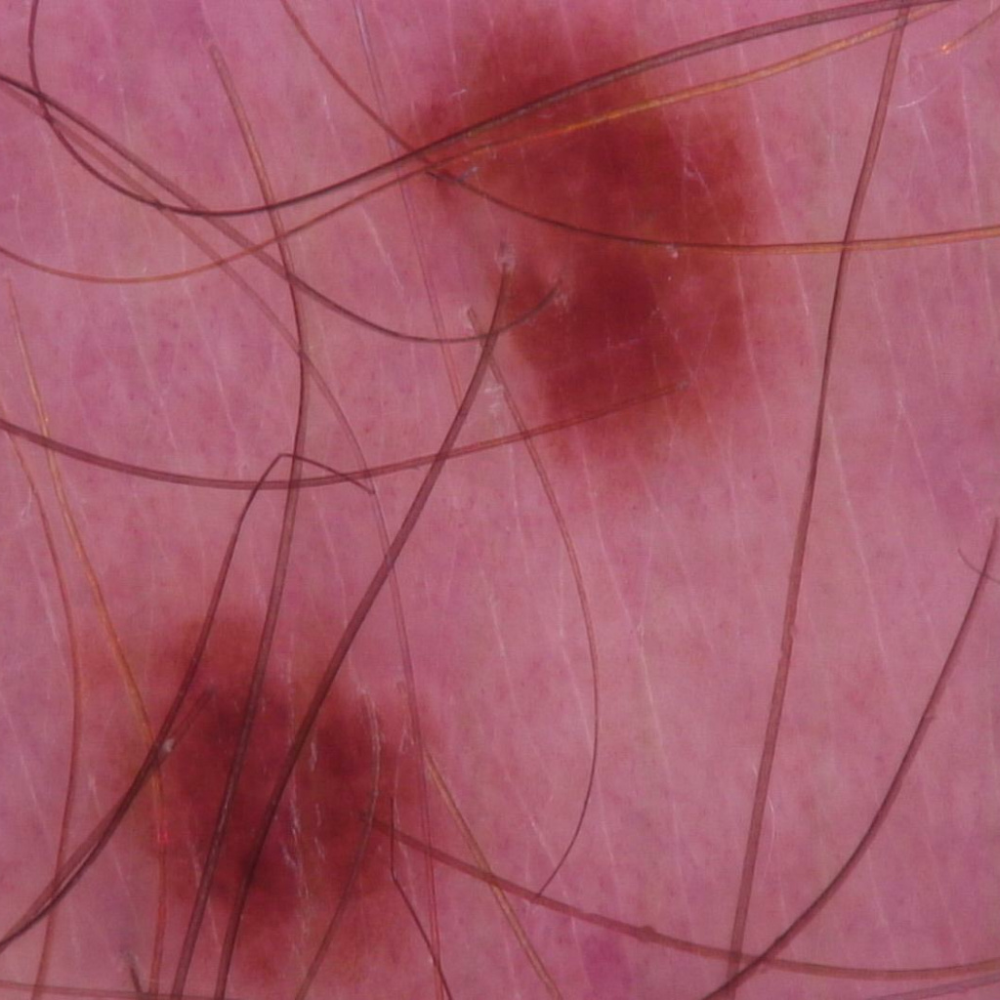

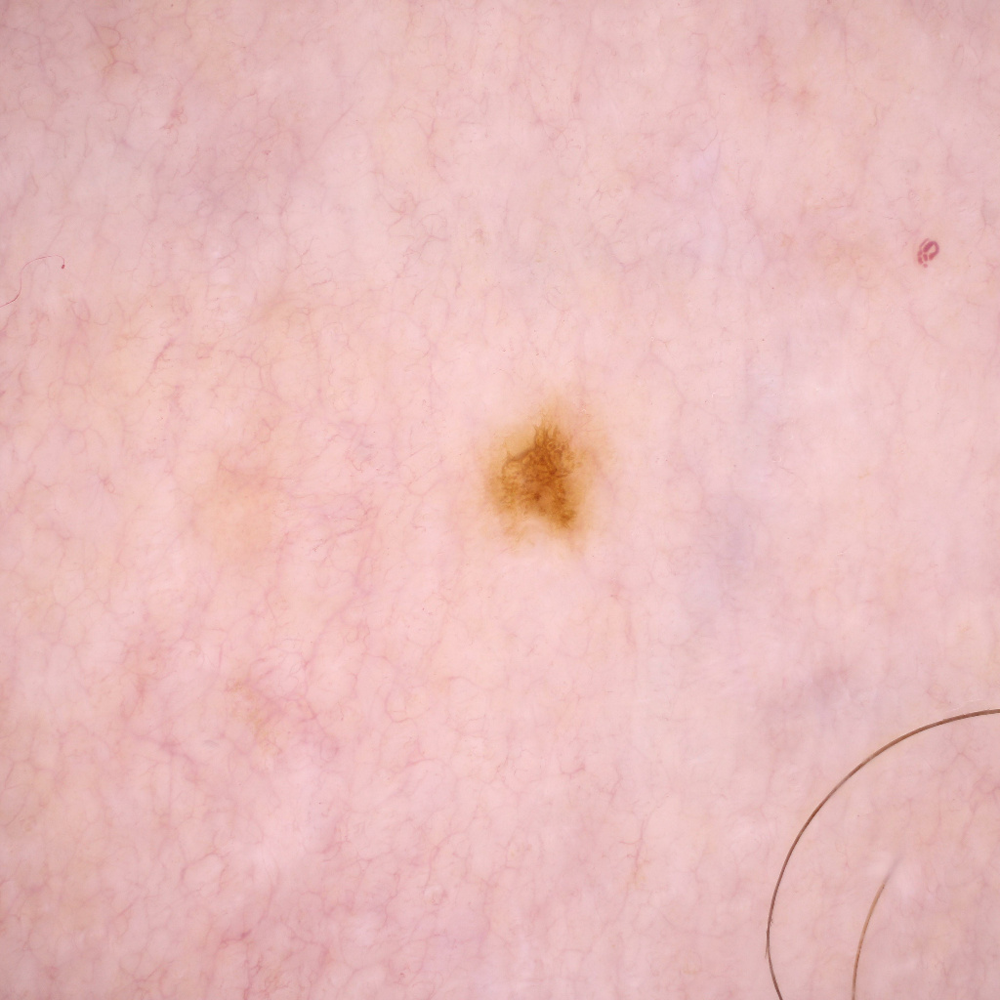

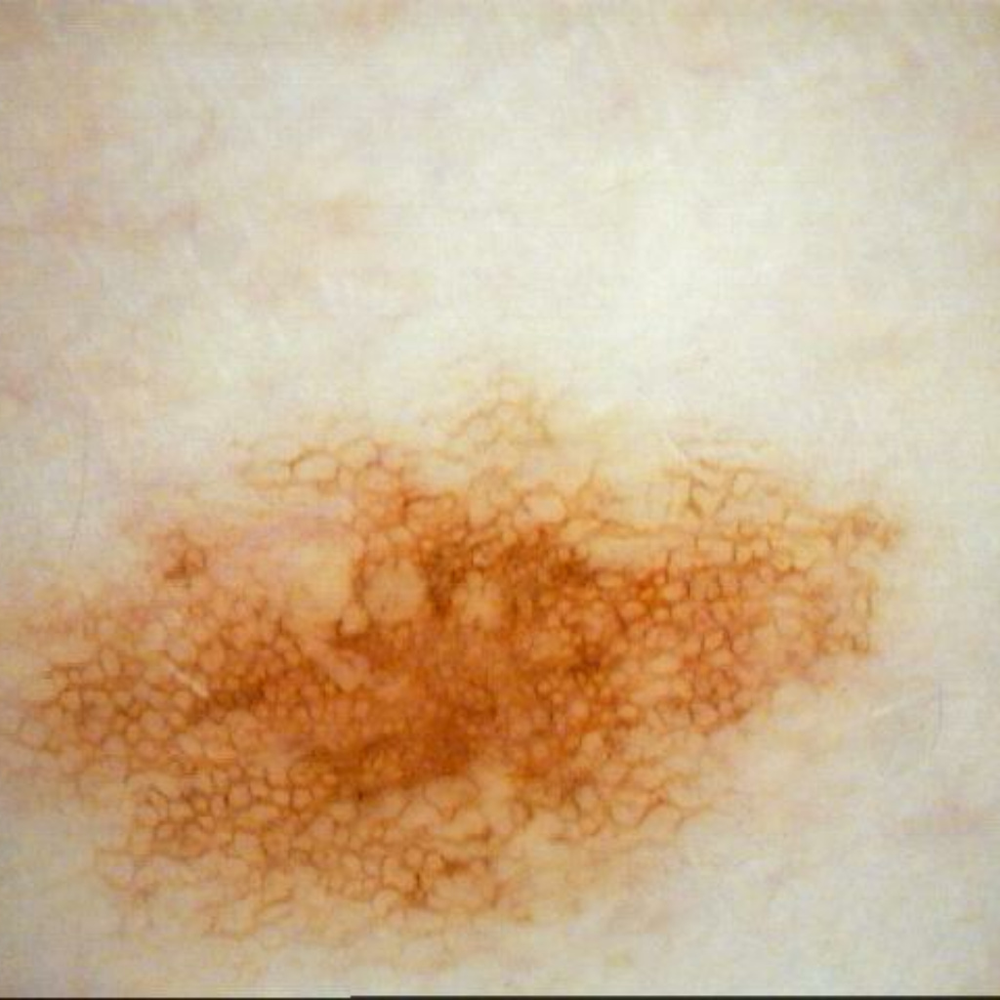

In [15]:
plot_some_images(load_image_set('sin_comprimir/train00-2071.tfrec'),3)

In [6]:
raw_image_dataset = tf.data.TFRecordDataset('sin_comprimir/train00-2071.tfrec')
for raw_record in raw_image_dataset.take(1):
  example = tf.train.Example()
  example.ParseFromString(raw_record.numpy())
  print(example)

features {
  feature {
    key: "image"
    value {
      bytes_list {
        value: "\377\330\377\340\000\020JFIF\000\001\001\001\001,\001,\000\000\377\333\000C\000\002\001\001\001\001\001\002\001\001\001\002\002\002\002\002\004\003\002\002\002\002\005\004\004\003\004\006\005\006\006\006\005\006\006\006\007\t\010\006\007\t\007\006\006\010\013\010\t\n\n\n\n\n\006\010\013\014\013\n\014\t\n\n\n\377\333\000C\001\002\002\002\002\002\002\005\003\003\005\n\007\006\007\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\377\300\000\021\010\004\000\004\000\003\001\021\000\002\021\001\003\021\001\377\304\000\034\000\000\002\003\001\001\001\001\000\000\000\000\000\000\000\000\000\004\005\002\003\006\007\001\000\010\377\304\000F\020\000\002\001\003\003\003\003\003\002\004\004\005\002\005\000\013\001\002\003\000\004\021\005\022!\006\0231\"AQ\007\024a2q#B\201\221\010\025R\241$3b\261\301\026\321Cr\341\360\361\027%S\202c\2224\2425s\223\377\304\000\034\

# Building dataframe with locations

In [7]:
files_dictionary = {'sin_comprimir/train00-2071.tfrec':1}

In [8]:
def dataframe_locations(file, dictionary):
    iset = load_image_set(file)
    image_name = []
    target = []
    group = dictionary[file]

    for image_features in iset:
        image_name.append(str(image_features['image_name'].numpy()))
        target.append(int(image_features['target'].numpy()))

    data = {'image name':image_name, 'target':target, 'fold':[group for x in target]}
    return pd.DataFrame(data) 

def find_positives(file):
    iset = load_image_set(file)
    image_name = []
    target = []

    for image_features in iset:
        image_name.append(str(image_features['image_name'].numpy()))
        target.append(int(image_features['target'].numpy()))

    data = {'image name':image_name, 'target':target, 'fold':[group for x in target]}
    return pd.DataFrame(data) 

def cleaning(word):
    t = word[2:]
    t = t.replace('"','')
    t = t.replace("'","")
    return str(t)

def search(positive_list, file):
    iset = load_image_set(file)
    images = []
    for image_features in iset:
        image_name = str(image_features['image_name'].numpy())
        image_name_processed = cleaning(image_name)
        if(image_name_processed in positive_list):
            images.append(image_features['image'].numpy())
        else:
            continue
    return dict(zip(positive_list, images))

In [9]:
%%time
fold1 = dataframe_locations('sin_comprimir/train00-2071.tfrec', files_dictionary)

Wall time: 21.8 s


In [10]:
fold1['target'].value_counts()

0    2038
1      33
Name: target, dtype: int64

In [11]:
fold1['image name'] = fold1['image name'].apply(lambda x: cleaning(x))

In [12]:
positive = list(fold1[fold1['target']==1]['image name'])
positive

['ISIC_1255336',
 'ISIC_2481044',
 'ISIC_6017985',
 'ISIC_6255113',
 'ISIC_8527092',
 'ISIC_7939816',
 'ISIC_5258657',
 'ISIC_2364150',
 'ISIC_7253401',
 'ISIC_3673080',
 'ISIC_7218890',
 'ISIC_3976496',
 'ISIC_8496052',
 'ISIC_9910791',
 'ISIC_3965087',
 'ISIC_4170698',
 'ISIC_0961235',
 'ISIC_3775417',
 'ISIC_3697702',
 'ISIC_6714082',
 'ISIC_0274382',
 'ISIC_5733748',
 'ISIC_1157032',
 'ISIC_5667461',
 'ISIC_1241817',
 'ISIC_6829008',
 'ISIC_6285925',
 'ISIC_2700320',
 'ISIC_4938994',
 'ISIC_3286186',
 'ISIC_0946787',
 'ISIC_7536704',
 'ISIC_5867911']

In [13]:
%%time
images = search(positive, 'sin_comprimir/train00-2071.tfrec')

Wall time: 24.8 s


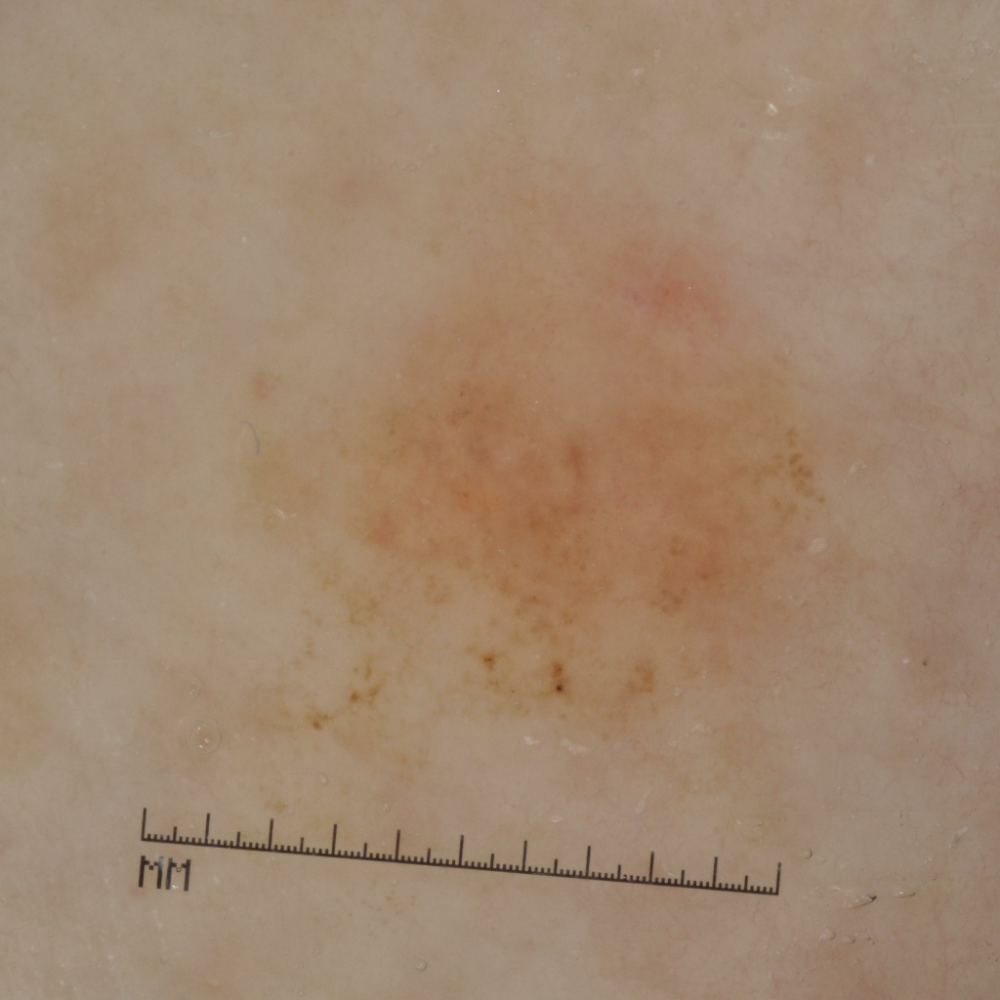

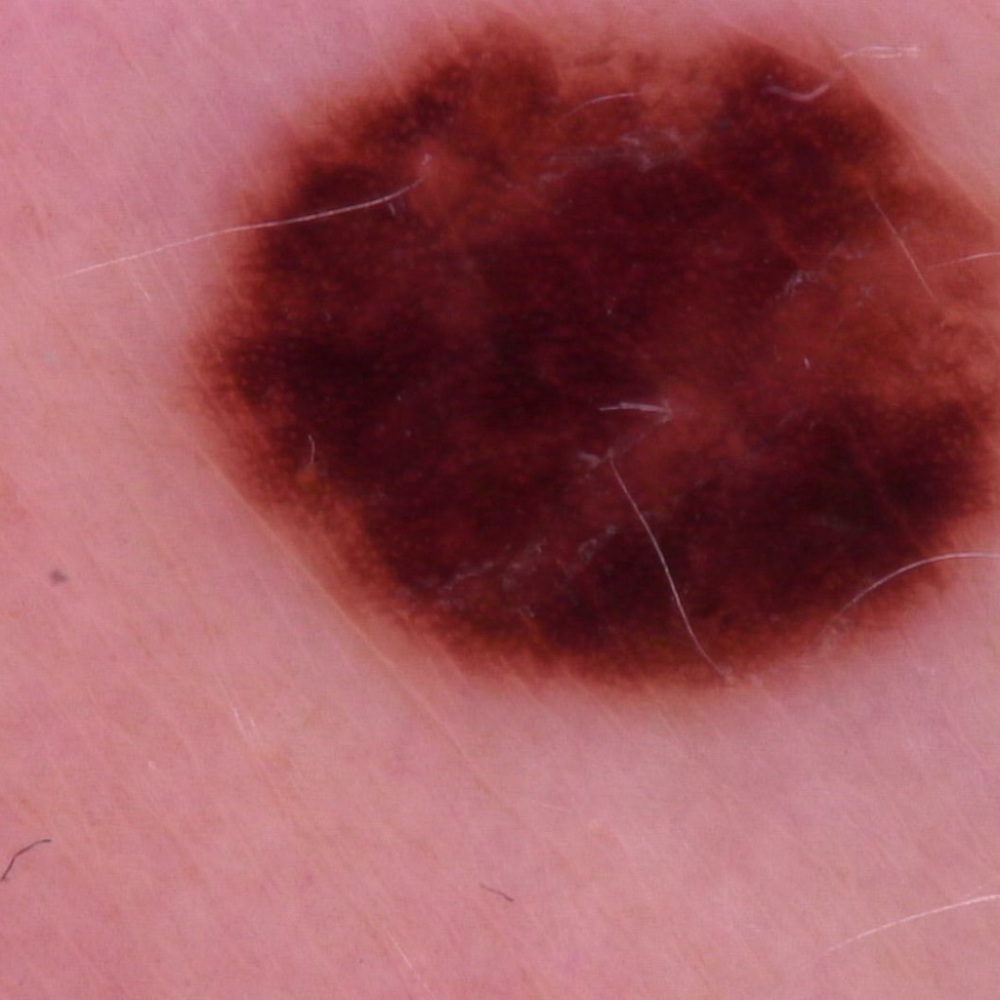

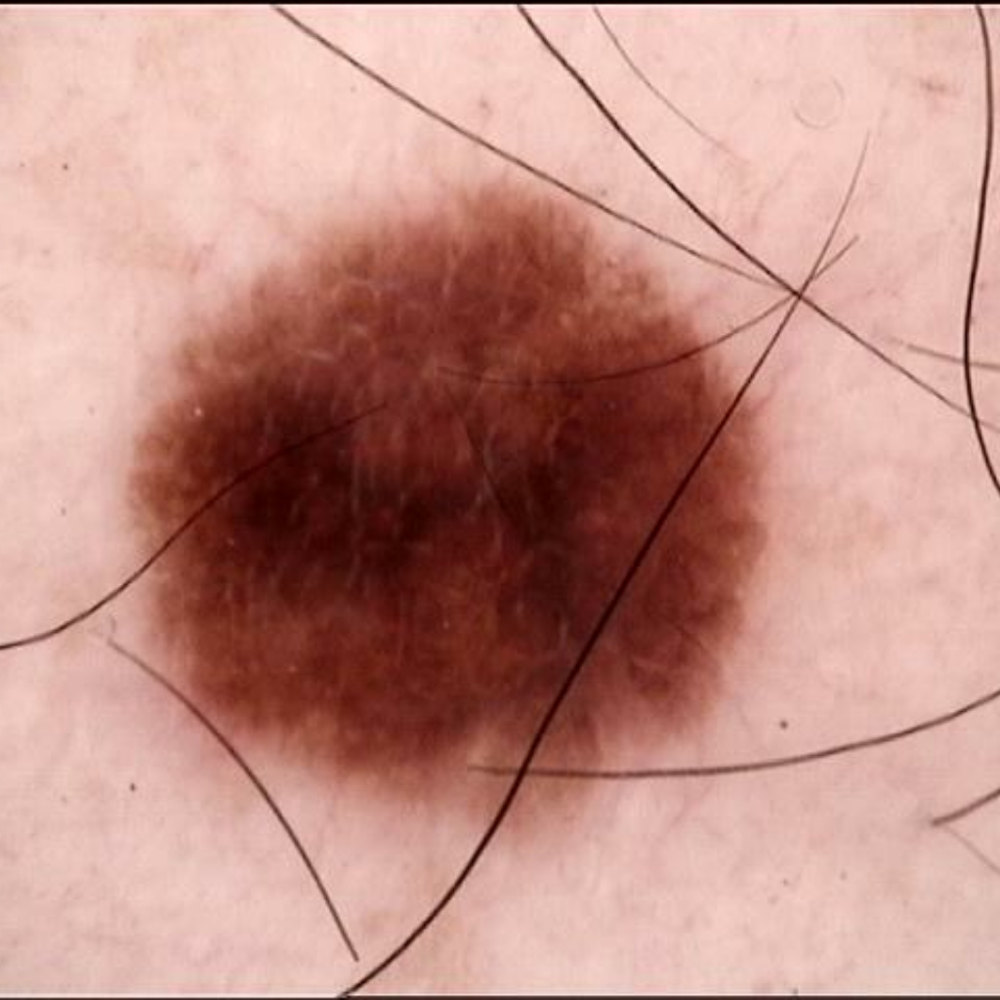

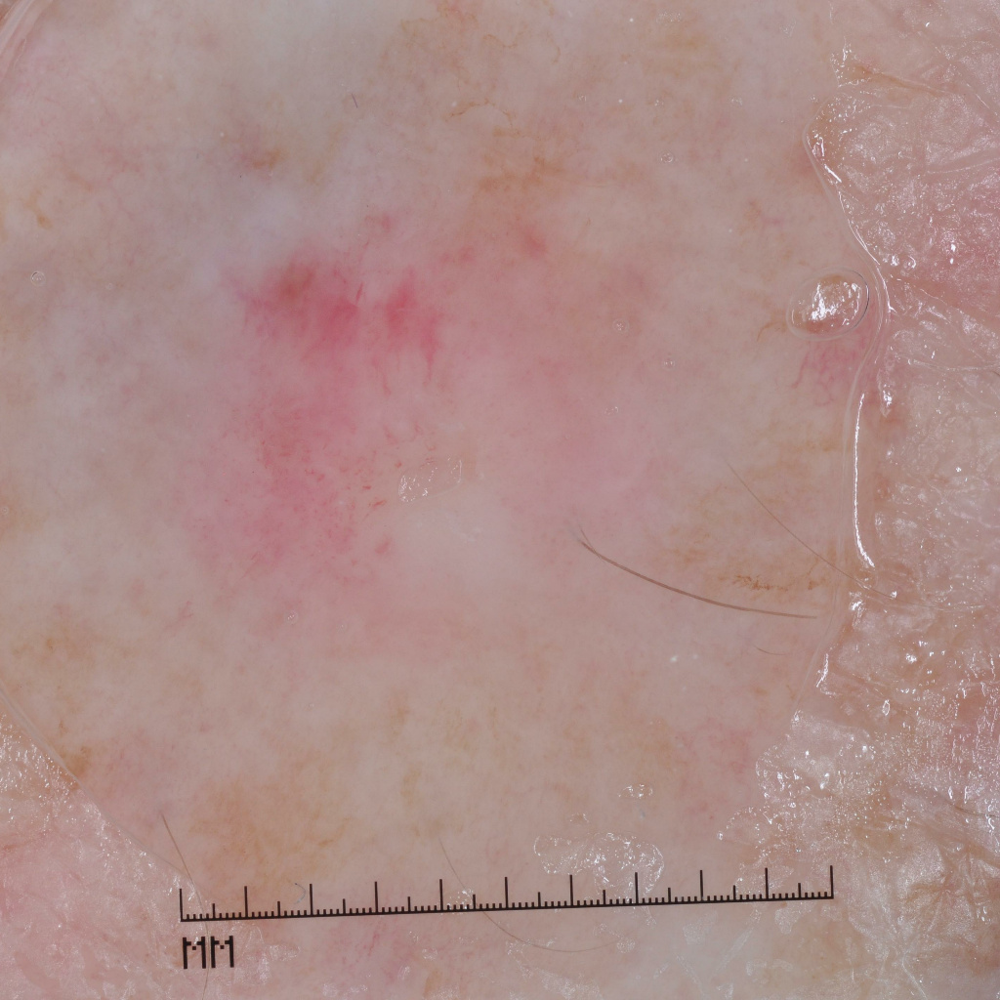

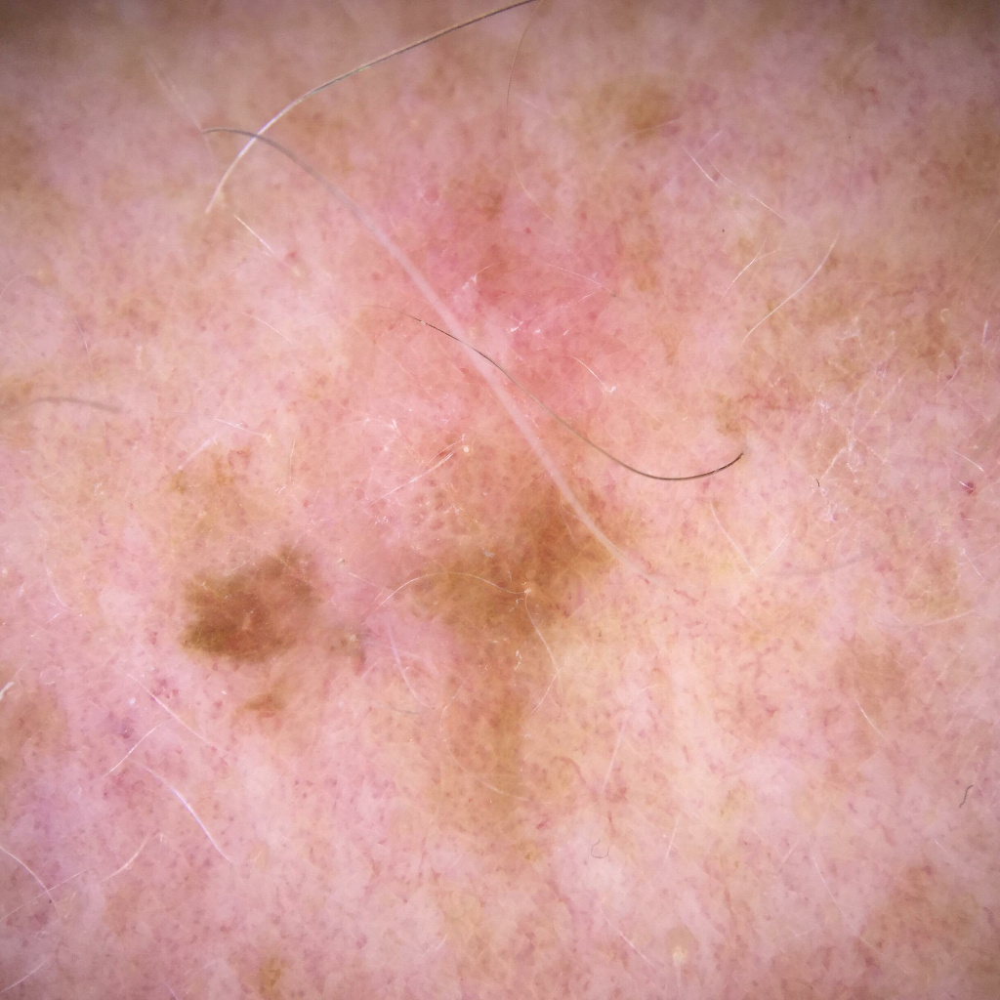

...

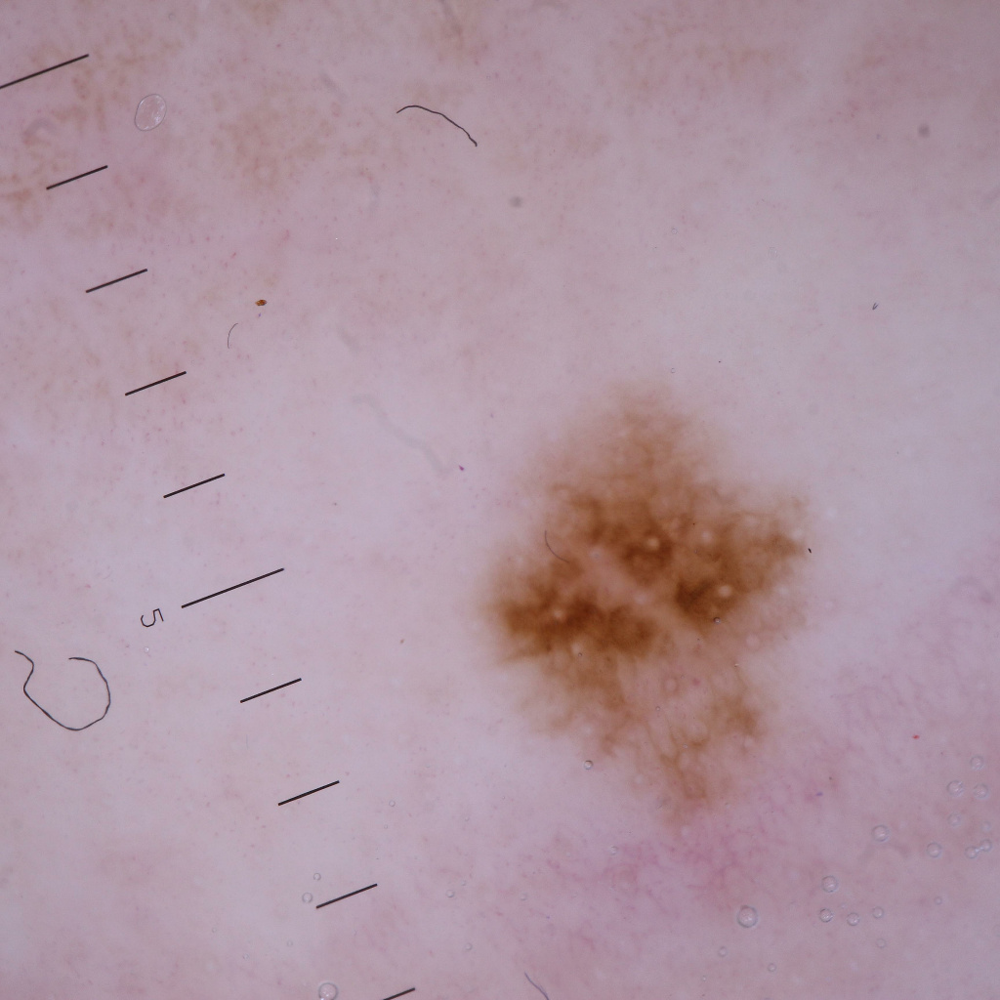

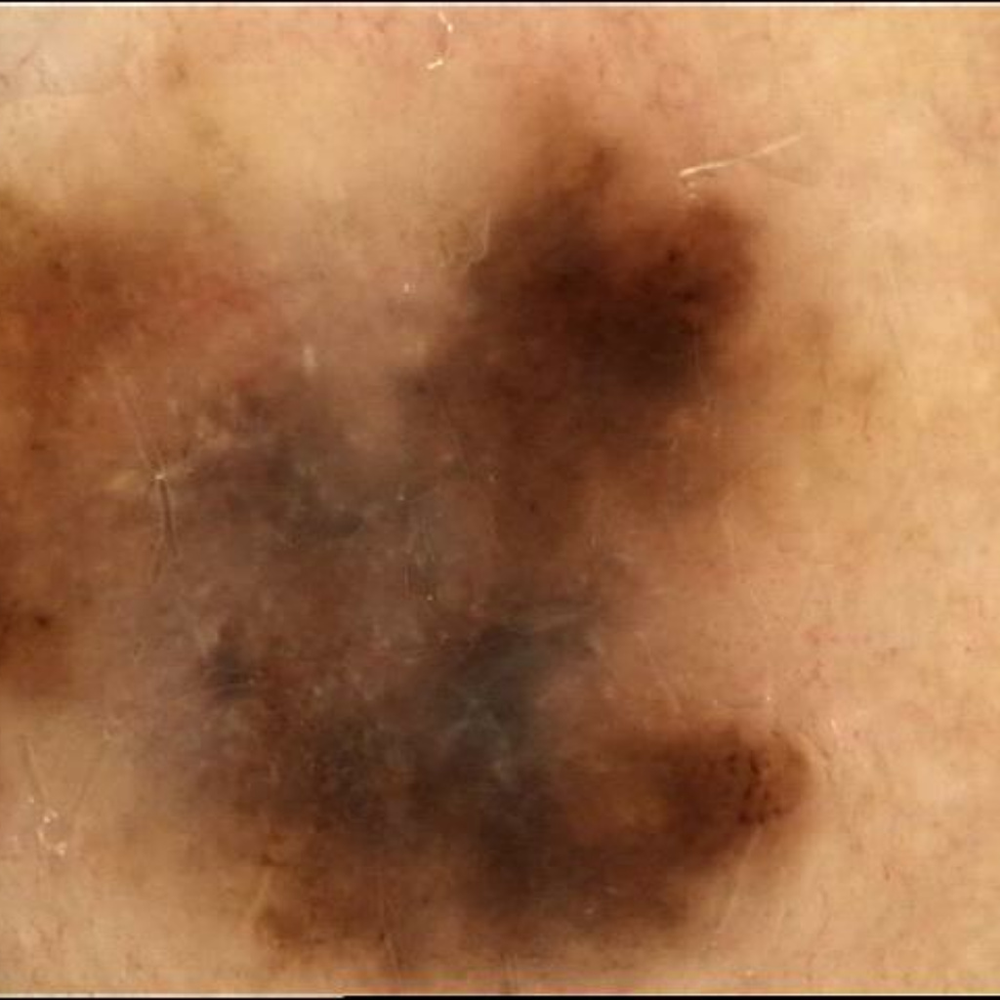

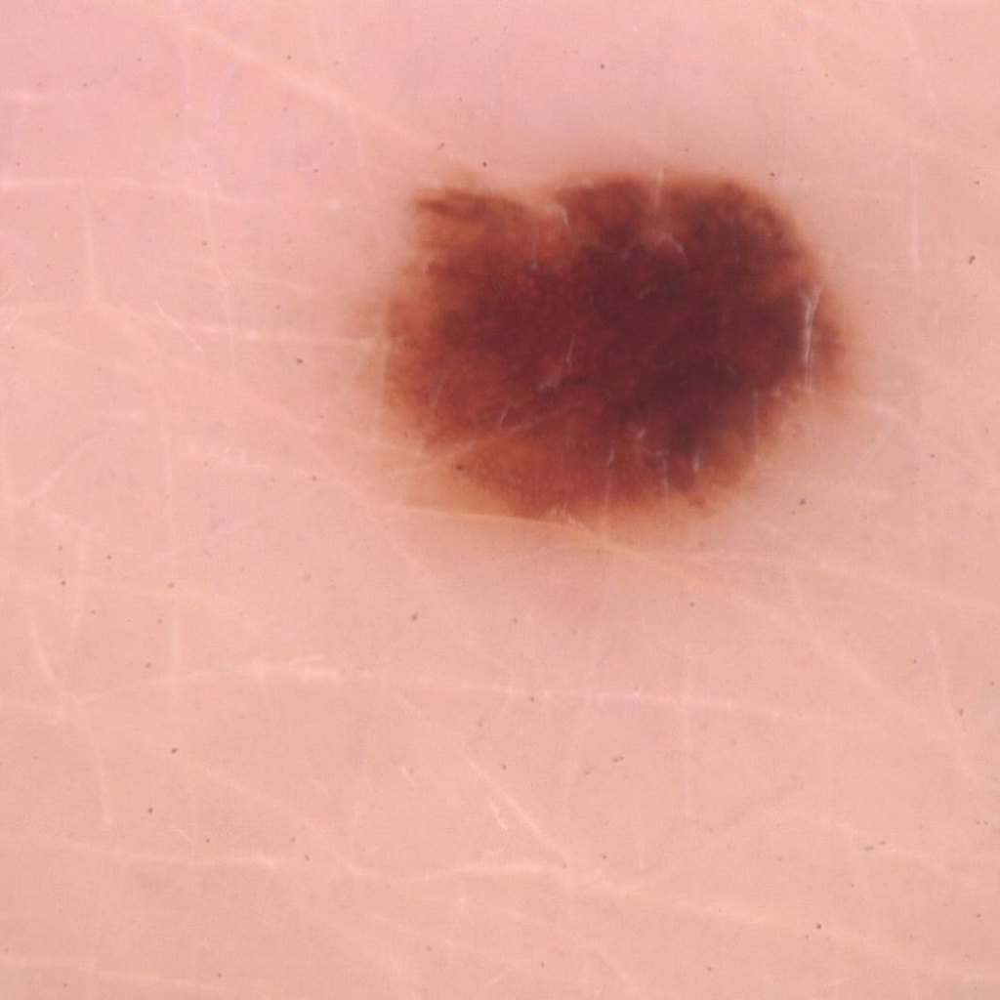

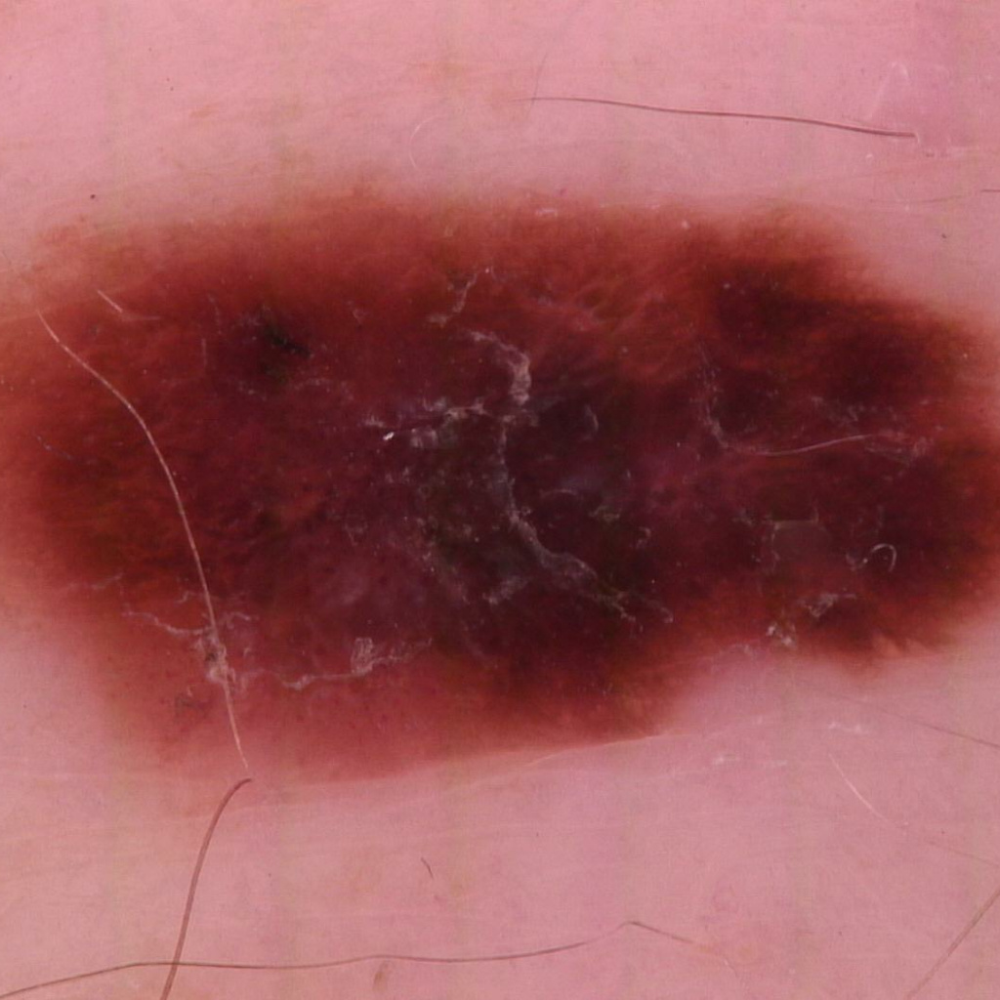

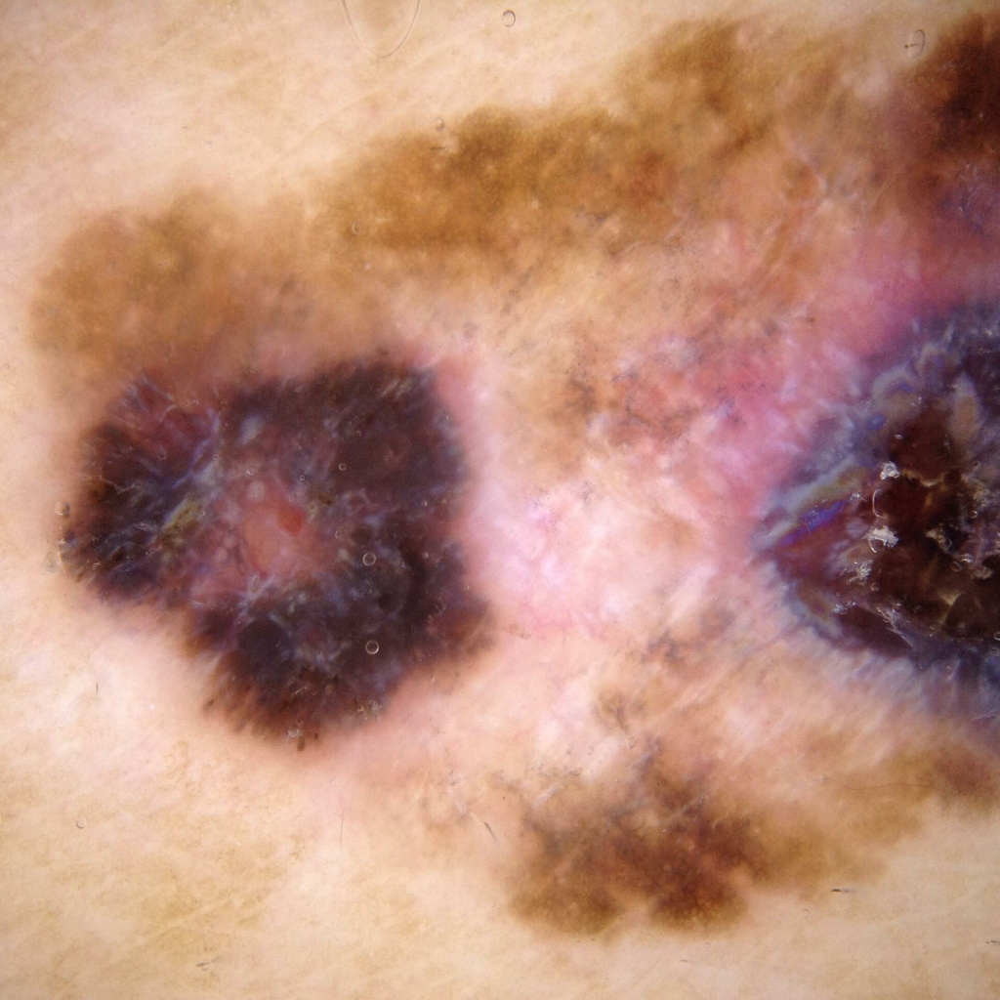

In [17]:
visualize(images.values())